# Generating rotten vegetables variations for Amazon Rekognition using Titan Image Generator (preview)

> This notebook should work well with the **`Data Science 3.0`** kernel in SageMaker Studio and with the **`conda_python3`** in a SageMaker Notebook Instance.

---

In this demo notebook, we show how to use [Titan Image Generator](https://docs.aws.amazon.com/bedrock/latest/userguide/titan-image-models.html) on [Amazon Bedrock](https://aws.amazon.com/bedrock/) for image generation (text-to-image).

Amazon Titan models incorporate 25 years of artificial intelligence (AI) and machine learning (ML) innovation at Amazon and offer a range of high-performing image, multimodal, and text model options through a fully managed API. AWS pre-trained these models on large datasets, making them powerful, general-purpose models built to support a variety of use cases while also supporting the responsible use of AI.

## Setup

⚠️ ⚠️ ⚠️ Before running this notebook, ensure you've run the [Bedrock boto3 setup notebook](bedrock_boto3_setup.ipynb#Prerequisites) notebook. ⚠️ ⚠️ ⚠️


In [32]:
# Python Built-Ins:
import base64
import io
import json
import os
import sys
import time

# External Dependencies:
import boto3
from PIL import Image
from io import BytesIO
from datetime import datetime

module_path = ".."
sys.path.append(os.path.abspath(module_path))

# ---- ⚠️ Un-comment and edit the below lines as needed for your AWS setup ⚠️ ----

# os.environ["AWS_DEFAULT_REGION"] = "<REGION_NAME>"  # E.g. "us-east-1"
# os.environ["AWS_PROFILE"] = "<YOUR_PROFILE>"
# os.environ["BEDROCK_ASSUME_ROLE"] = "<YOUR_ROLE_ARN>"  # E.g. "arn:aws:..."


# boto3_bedrock = bedrock.get_bedrock_client(
#     assumed_role=os.environ.get("BEDROCK_ASSUME_ROLE", None),
#     region=os.environ.get("AWS_DEFAULT_REGION", None),
#     runtime=False
# )


bedrock_runtime = boto3.client(service_name="bedrock-runtime")
s3 = boto3.client('s3')

## Image Variation on Amazon Bedrock

In text-to-image mode, we'll provide sample images of what image **should** be generated. <br>
Image variation uses an image and an optional text prompt as input. It generates a new image that preserves the content of the input image, but variates its style and background.

imageVariationParams:
* text: prompt,
* negativeText: negative_prompt
* images: [images]

ImageGenerationConfig Options:
* numberOfImages: Number of images to be generated
* quality: Quality of generated images, can be standard or premium
* height: Height of output image(s)
* width: Width of output image(s)
* cfgScale: Scale for classifier-free guidance
* seed: The seed to use for reproducibility  

In [33]:
prompt = "rotten vegetables"
negative_prompt = "poorly rendered"
numberOfImages = 5   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 768        # Supported height list in the docs 
width = 1280          # Supported width list in the docs
cfgScale = 9       # Range: 1.0 (exclusive) to 10.0
seed = 21478            # Range: 0 to 214783647

The Amazon Bedrock `InvokeModel` provides access to titan-image-generator by setting the right model ID, and returns a JSON response including a [Base64 encoded string](https://en.wikipedia.org/wiki/Base64) that represents the (PNG) image.

For more information on available input parameters for the model, refer to the [Titan Image Generator blog](https://aws.amazon.com/ko/blogs/aws/amazon-titan-image-generator-multimodal-embeddings-and-text-models-are-now-available-in-amazon-bedrock/).

The cell below invokes the Titan model through Amazon Bedrock to create an initial image string:

In [34]:
def image_to_base64(img) -> str:
    """Convert a PIL Image or local image file path to a base64 string for Amazon Bedrock"""
    if isinstance(img, str):
        if os.path.isfile(img):
            print(f"Reading image from file: {img}")
            with open(img, "rb") as f:
                return base64.b64encode(f.read()).decode("utf-8")
        else:
            raise FileNotFoundError(f"File {img} does not exist")
    elif isinstance(img, Image.Image):
        buffer = io.BytesIO()
        img.save(buffer, format="PNG")
        return base64.b64encode(buffer.getvalue()).decode("utf-8")
    else:
        raise ValueError(f"Expected str (filename) or PIL Image. Got {type(img)}")

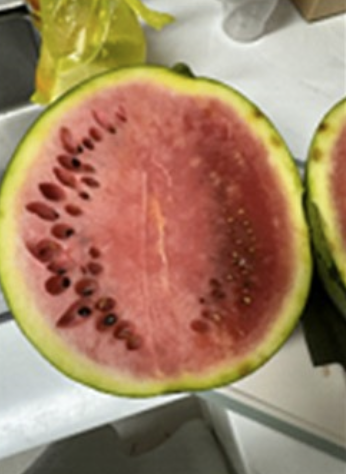

In [35]:
os.makedirs("images", exist_ok=True)

original = Image.open('images/prd-1.png').convert("RGB")
original

In [36]:
modelId = "amazon.titan-image-generator-v1"
prompt = "photo-realistic"
negative_prompt = "bad quality, low resolution, cartoon"
numberOfImages = 2   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 512        # Supported height list in the docs 
width = 512          # Supported width list in the docs
cfgScale = 6      # Range: 1.0 (exclusive) to 10.0
seed = 214780            # Range: 0 to 214783647

In [37]:
body = json.dumps(
    {
        "taskType": "IMAGE_VARIATION",
        "imageVariationParams": {
             "text": prompt,  # Optional,
             "negativeText": negative_prompt,   # Optional,
             "images": [image_to_base64(original)],                                  # One image is required
         },
        "imageGenerationConfig": {
            "numberOfImages": numberOfImages,   # Range: 1 to 5 
            "quality": quality,  # Options: standard or premium
            "height": height,
            "width": width,
            "cfgScale": cfgScale, 
            "seed": seed
        }
    }
)

response = bedrock_runtime.invoke_model(
    body = body, 
    modelId = modelId,
    accept = "application/json", 
    contentType = "application/json"
)
response_body = json.loads(response.get("body").read())

images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]

reko-variation/watermelon/random_generated_2023-12-14-03:16:28-0.png


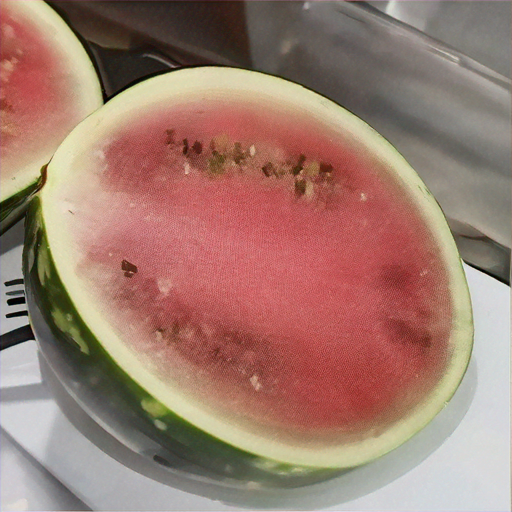

reko-variation/watermelon/random_generated_2023-12-14-03:16:28-1.png


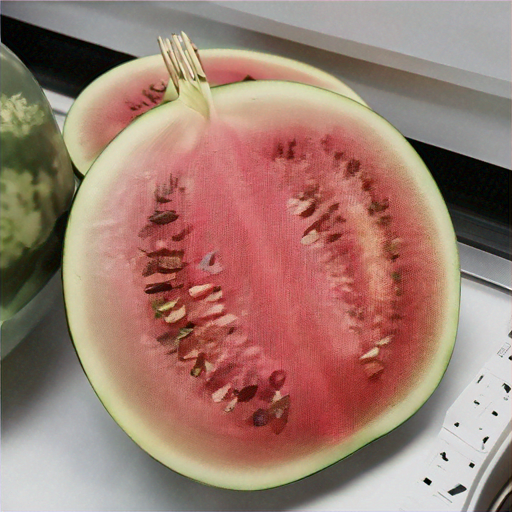

In [38]:
for index, img in enumerate(images):
    IMAGE_KEY = prefix + "random_generated_" + datetime.today().strftime("%Y-%m-%d-%H:%M:%S") + "-" + str(index) + ".png"
    print(IMAGE_KEY)
    # to save the image to local   
    # img.save("images/" + IMAGE_KEY)    
    display(img)   

## Upload image variations to S3

In [ ]:
def generateAndUploadVariations(prefix, image_path, prompt, negative_prompt, numberOfImages, quality, height, width, cfgScale, seed):
    
    original = Image.open(image_path).convert("RGB")
    
    body = json.dumps(
        {
            "taskType": "IMAGE_VARIATION",
            "imageVariationParams": {
                 "text": prompt,  # Optional,
                 "negativeText": negative_prompt,   # Optional,
                 "images": [image_to_base64(original)],                                  # One image is required
             },
            "imageGenerationConfig": {
                "numberOfImages": numberOfImages,   # Range: 1 to 5 
                "quality": quality,  # Options: standard or premium
                "height": height,
                "width": width,
                "cfgScale": cfgScale, 
                "seed": seed
            }
        }
    )

    response = bedrock_runtime.invoke_model(
        body = body, 
        modelId = modelId,
        accept = "application/json", 
        contentType = "application/json"
    )
    response_body = json.loads(response.get("body").read())

    images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]  
    
    for index, img in enumerate(images):
        IMAGE_KEY = prefix + "variation_generated_" + datetime.today().strftime("%Y-%m-%d-%H:%M:%S") + "-" + str(index) + ".png"
        in_mem_file = io.BytesIO()
        img.save(in_mem_file, format=img.format)
        in_mem_file.seek(0)
        s3.upload_fileobj(
            Fileobj=in_mem_file,
            Bucket=BUCKET,
            Key=IMAGE_KEY,
            ExtraArgs={"ContentType":"image/png"},
            Callback=None,
            Config=None)        

Generate watermelon

reko-variation/watermelon/random_generated_2023-12-14-03:15:27-0.png


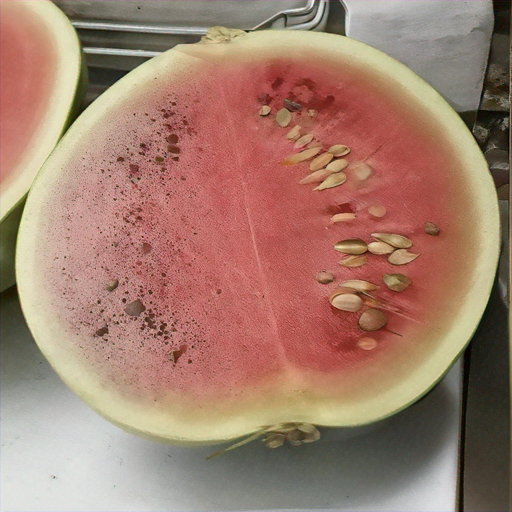

reko-variation/watermelon/random_generated_2023-12-14-03:15:27-1.png


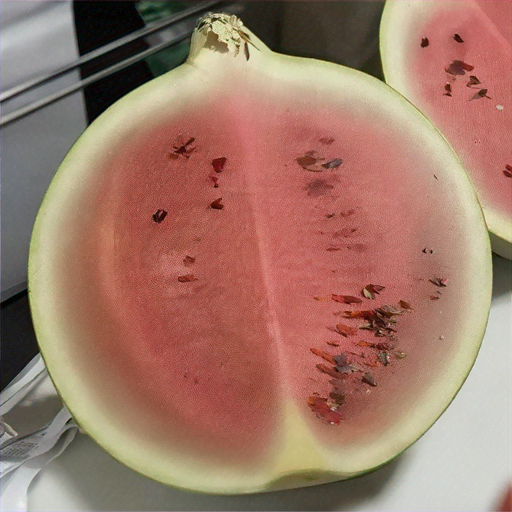

reko-variation/watermelon/random_generated_2023-12-14-03:15:27-2.png


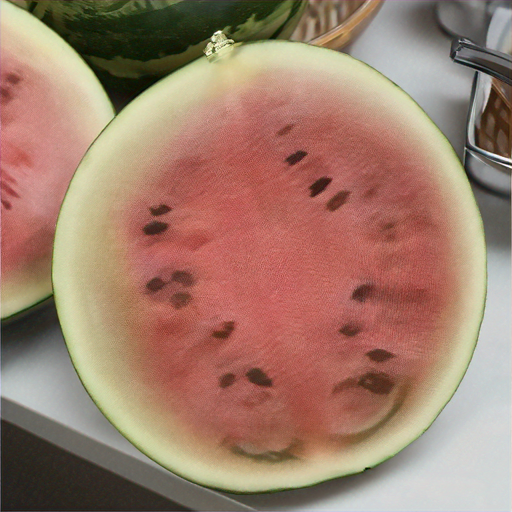

In [31]:
BUCKET = "hyogrin-custom-project1-us-east-1"
prefix = "reko-variation/watermelon/"
local_image_path = "images/prd-1.png"
prompt = "photo-realistic"
negative_prompt = "bad quality, low resolution, cartoon"
numberOfImages = 3   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 512        # Supported height list in the docs 
width = 512          # Supported width list in the docs
cfgScale = 6      # Range: 1.0 (exclusive) to 10.0
seed = 2147            # Range: 0 to 214783647

for i in range(1,2): #maximum 6
    seed = seed * i
    generateAndUploadVariations(prefix, local_image_path, prompt, negative_prompt, numberOfImages, quality, height, width, cfgScale, seed)
    time.sleep(1)

reko-variation/sesameleaf/random_generated_2023-12-14-03:42:41-0.png


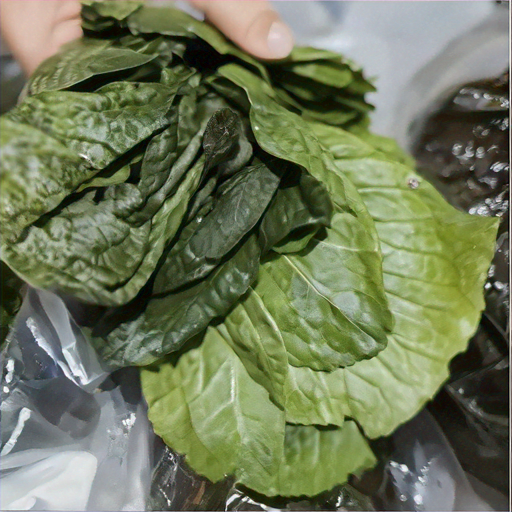

reko-variation/sesameleaf/random_generated_2023-12-14-03:42:41-1.png


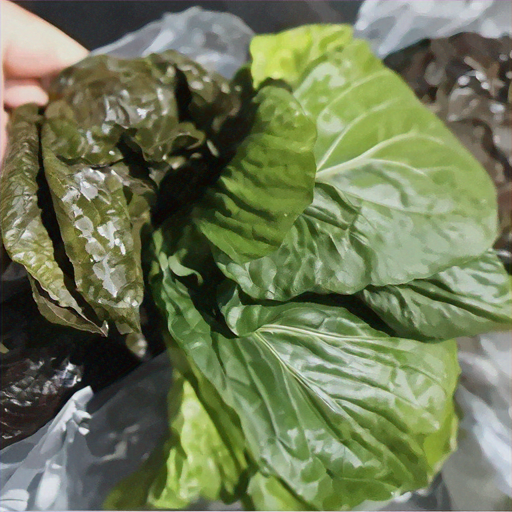

reko-variation/sesameleaf/random_generated_2023-12-14-03:42:41-2.png


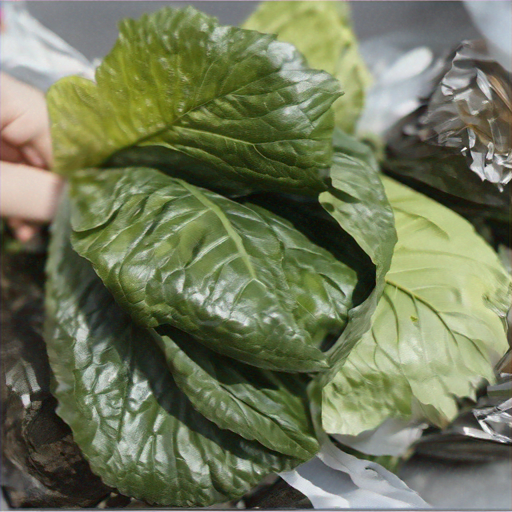

In [39]:
BUCKET = "hyogrin-custom-project1-us-east-1"
prefix = "reko-variation/sesameleaf/"
local_image_path = "images/prd-3.png"
prompt = "photo-realistic"
negative_prompt = "bad quality, low resolution, cartoon"
numberOfImages = 3   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 512        # Supported height list in the docs 
width = 512          # Supported width list in the docs
cfgScale = 6      # Range: 1.0 (exclusive) to 10.0
seed = 2147            # Range: 0 to 214783647

for i in range(1,2): #maximum 6
    seed = seed * i
    generateAndUploadVariations(prefix, local_image_path, prompt, negative_prompt, numberOfImages, quality, height, width, cfgScale, seed)
    time.sleep(1)

reko-variation/pear/random_generated_2023-12-14-03:43:01-0.png


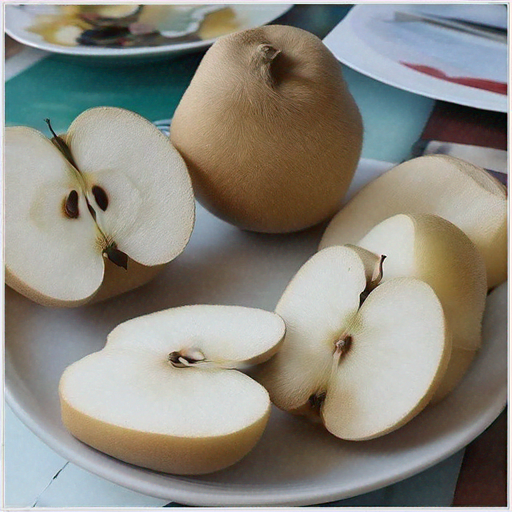

reko-variation/pear/random_generated_2023-12-14-03:43:01-1.png


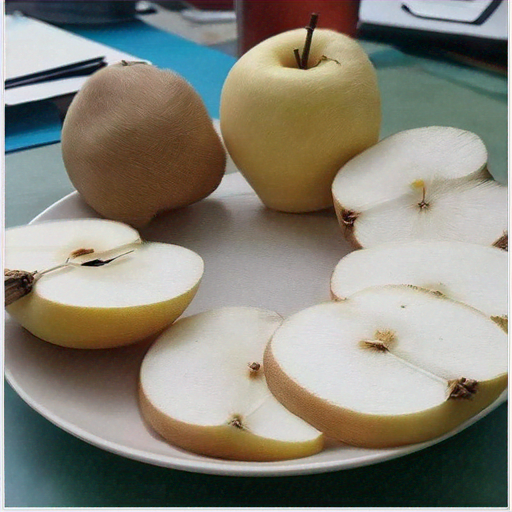

reko-variation/pear/random_generated_2023-12-14-03:43:01-2.png


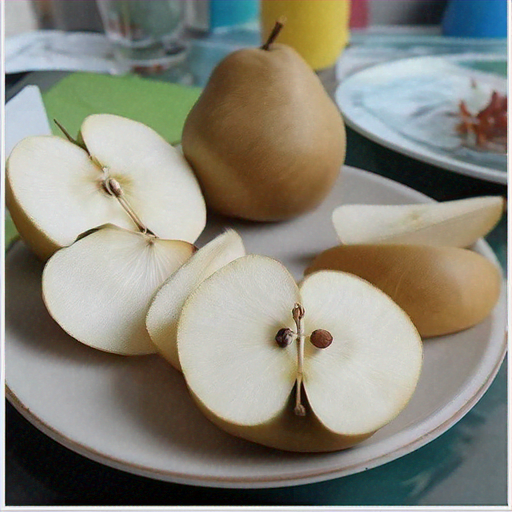

In [40]:
BUCKET = "hyogrin-custom-project1-us-east-1"
prefix = "reko-variation/pear/"
local_image_path = "images/prd-5.png"
prompt = "photo-realistic"
negative_prompt = "bad quality, low resolution, cartoon"
numberOfImages = 3   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 512        # Supported height list in the docs 
width = 512          # Supported width list in the docs
cfgScale = 6      # Range: 1.0 (exclusive) to 10.0
seed = 2147            # Range: 0 to 214783647

for i in range(1,2): #maximum 6
    seed = seed * i
    generateAndUploadVariations(prefix, local_image_path, prompt, negative_prompt, numberOfImages, quality, height, width, cfgScale, seed)
    time.sleep(1)

reko-variation/pasta/random_generated_2023-12-14-03:43:22-0.png


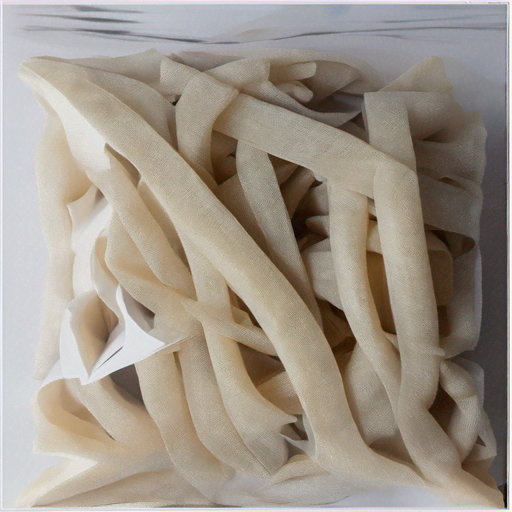

reko-variation/pasta/random_generated_2023-12-14-03:43:22-1.png


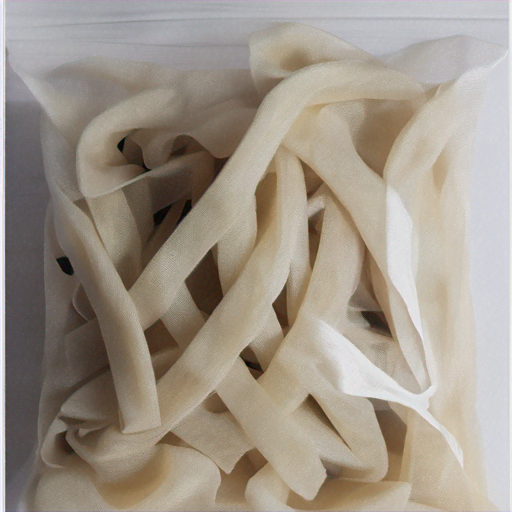

reko-variation/pasta/random_generated_2023-12-14-03:43:22-2.png


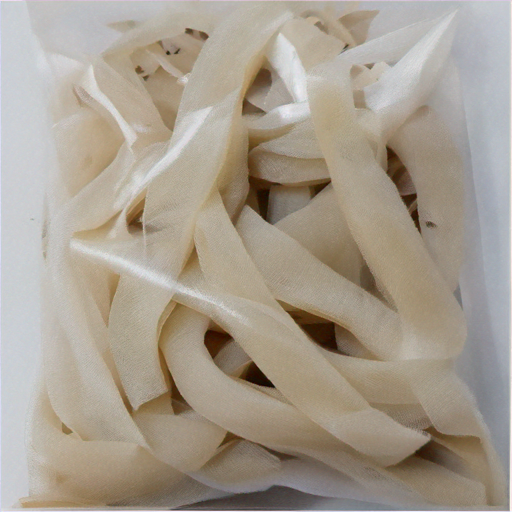

In [41]:
BUCKET = "hyogrin-custom-project1-us-east-1"
prefix = "reko-variation/pasta/"
local_image_path = "images/prd-6.png"
prompt = "photo-realistic"
negative_prompt = "bad quality, low resolution, cartoon"
numberOfImages = 3   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 512        # Supported height list in the docs 
width = 512          # Supported width list in the docs
cfgScale = 6      # Range: 1.0 (exclusive) to 10.0
seed = 2147            # Range: 0 to 214783647

for i in range(1,2): #maximum 6
    seed = seed * i
    generateAndUploadVariations(prefix, local_image_path, prompt, negative_prompt, numberOfImages, quality, height, width, cfgScale, seed)
    time.sleep(1)